# **Otsu's Threshold Method**

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

!wget https://i.ibb.co/RYW5SQk/tom.jpg
!wget https://i.ibb.co/N94X50V/panther.jpg
!wget https://i.ibb.co/2NWV44h/bookpage-1.jpg
!wget https://i.ibb.co/FBLxZdc/bookpage-2.jpg

--2024-03-11 17:23:11--  https://i.ibb.co/RYW5SQk/tom.jpg
Resolving i.ibb.co (i.ibb.co)... 169.197.85.95
Connecting to i.ibb.co (i.ibb.co)|169.197.85.95|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 50188 (49K) [image/jpeg]
Saving to: ‘tom.jpg’

tom.jpg             100%[===================>]  49.01K  --.-KB/s    in 0.01s   

2024-03-11 17:23:12 (3.45 MB/s) - ‘tom.jpg’ saved [50188/50188]

--2024-03-11 17:23:12--  https://i.ibb.co/N94X50V/panther.jpg
Resolving i.ibb.co (i.ibb.co)... 169.197.85.95
Connecting to i.ibb.co (i.ibb.co)|169.197.85.95|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 100122 (98K) [image/jpeg]
Saving to: ‘panther.jpg’

panther.jpg         100%[===================>]  97.78K  --.-KB/s    in 0.02s   

2024-03-11 17:23:12 (4.48 MB/s) - ‘panther.jpg’ saved [100122/100122]

--2024-03-11 17:23:12--  https://i.ibb.co/2NWV44h/bookpage-1.jpg
Resolving i.ibb.co (i.ibb.co)... 169.197.85.95
Connecting to i.ibb.co (i.ibb.co)

In [ ]:
intensity_values=np.arange(256)            #image is of 8 bit with intensity from o to 255

In [ ]:
tom=cv.imread('tom.jpg',0)           #here we are reading our image through open cv library where 0 is making us read the imgage in grayscale with image represented as a numopy 2d array.
panther=cv.imread('panther.jpg',0)
bookpage1=cv.imread('bookpage-1.jpg',0)
bookpage2=cv.imread('bookpage-2.jpg',0)

##**Images involved in the assignment**

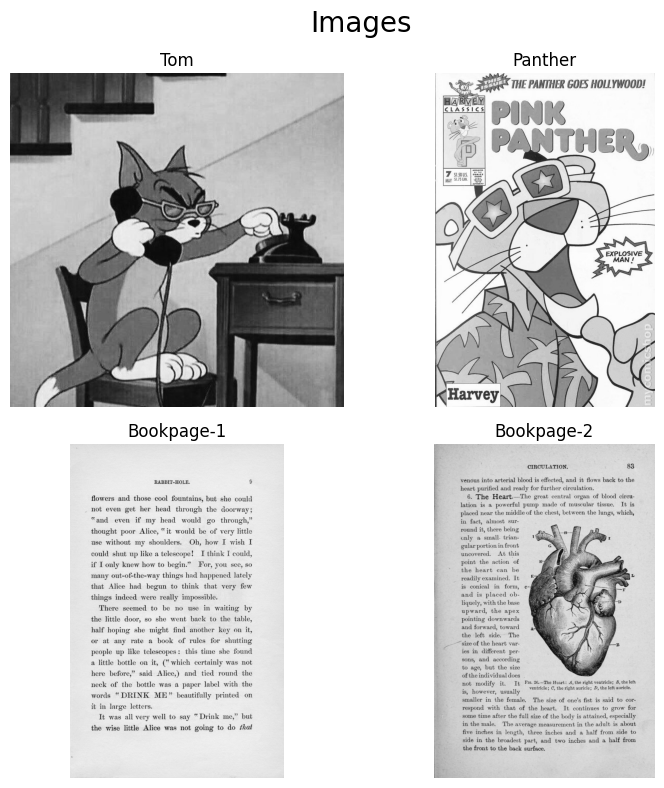

In [ ]:
fig,ax= plt.subplots(nrows=2,ncols=2,figsize=(8,8))

ax[0][0].imshow(cv.cvtColor(tom, cv.COLOR_BGR2RGB))
ax[0][0].axis('off')
ax[0][0].set_title('Tom')
ax[0][1].imshow(cv.cvtColor(panther, cv.COLOR_BGR2RGB))
ax[0][1].axis('off')
ax[0][1].set_title('Panther')

ax[1][0].imshow(cv.cvtColor(bookpage1, cv.COLOR_BGR2RGB))
ax[1][0].axis('off')
ax[1][0].set_title('Bookpage-1')
ax[1][1].imshow(cv.cvtColor(bookpage2, cv.COLOR_BGR2RGB))
ax[1][1].axis('off')
ax[1][1].set_title('Bookpage-2')

fig.suptitle('Images', fontsize=20)
fig.tight_layout()
plt.show()

In [ ]:
def pixel_intensity(img):                        #calculating total number of pixels for each intensity by interating through 2d array of image
  intensity=np.arange(256)
  pixel=np.zeros(256,dtype=int)
  r,c=np.shape(img)
  for i in range(r):
    for j in range(c):
      pixel[img[i,j]]+=1
  return pixel

In [ ]:
def pdf_img(img):                          #pdf of image array
  pixel_pdf=pixel_intensity(img)/np.sum(pixel_intensity(img))
  return pixel_pdf

In [ ]:
def cdf_img(img):                          #cdf of image array
  pixel_pdf=pdf_img(img)
  pixel_cdf=np.cumsum(pixel_pdf)
  return pixel_cdf

### **Plot of Images**

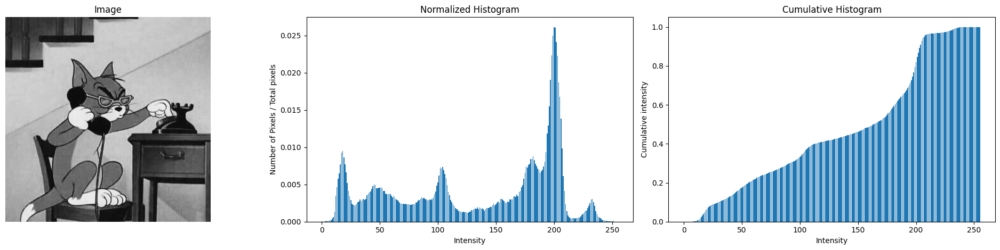

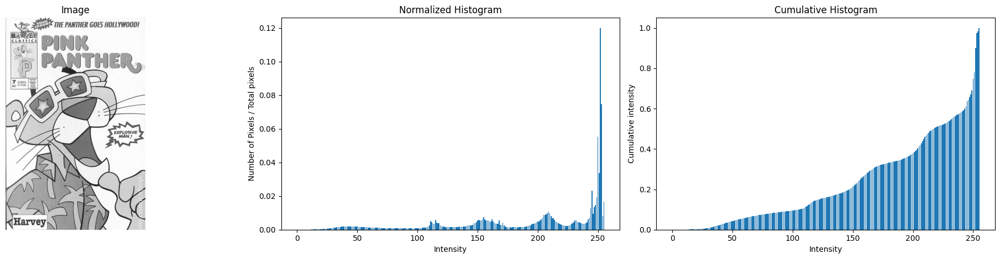

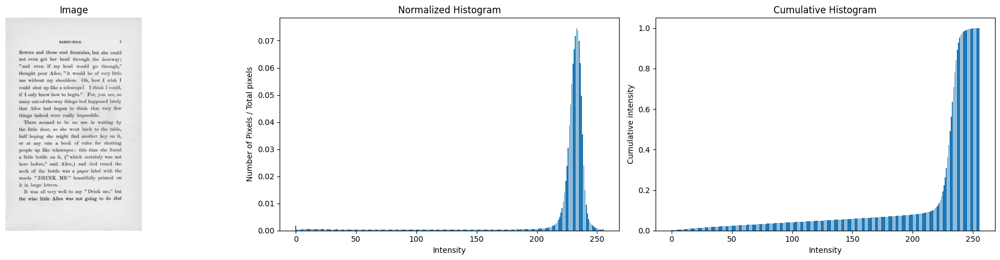

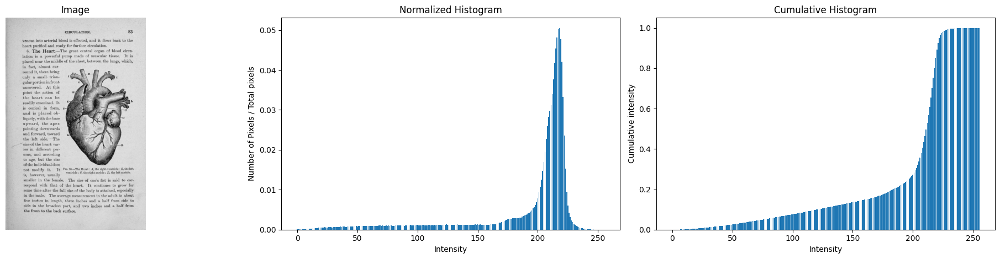

In [ ]:
def plot_cdf_pdf_img(img):
  pixel1=pdf_img(img)
  pixel2=cdf_img(img)
  fig, ax = plt.subplots(nrows=1, ncols=3)
  fig.set_figwidth(20)
  ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
  ax[0].axis('off')
  ax[0].set_title('Image')
  ax[1].bar(intensity_values,pixel1, width = 0.75)
  ax[1].set_title('Normalized Histogram')
  ax[1].set_xlabel('Intensity')
  ax[1].set_ylabel('Number of Pixels / Total pixels')
  ax[2].bar(intensity_values,pixel2, width = 0.75)
  ax[2].set_title('Cumulative Histogram')
  ax[2].set_xlabel('Intensity')
  ax[2].set_ylabel('Cumulative intensity')
  fig.tight_layout()
  plt.show()
plot_cdf_pdf_img(tom)
plot_cdf_pdf_img(panther)
plot_cdf_pdf_img(bookpage1)
plot_cdf_pdf_img(bookpage2)

### **OTSU'S Method**

The method is used to compute the **Threshold value** which best separates the foreground(of interest) and the background(of not interest) of the image this are the two clusters in which we divide our image based on our interest.
In this method we assume a optimal threshold value and than we calculate the inter class varience or intra class varience and take that vaue of threshold whoes varience is maximize or minimize.
Formula for probability

$ P(i) = \frac{n_i}{n}. $
here, $ n_i=$ Number of pixel of i intensity

$n=$ Total number of pixel

$t=$ value of threshold

$w_1(t) = \sum_{i=1}^{t}P(i),$ value of weigth for cluster of background pixel intensity

$w_2(t) = \sum_{i=t+1}^{I}P(i),$ value of weigth for cluster of foreground pixel intensity

$\mu_1(t) = \sum_{i=1}^{t}\frac{iP(i)}{w_1(t)},$ mean for cluster of background pixel intensity

$\mu_2(t) = \sum_{i=t+1}^{I}\frac{iP(i)}{w_2(t)},$ mean for cluster of foreground pixel intensity

Formula for Between class Varience:

$ \sigma_b^2(t) = w_1(t)w_2(t)[\mu_1(t) - \mu_2(t)]^2 $

We find the value of t for which the varience is maximum in between class varience and take that t as our final threshold.

In [ ]:
def image_data(img):        #in this def function we are finding the data required for application of otsu method
  pixel=pixel_intensity(img)
  r,c=np.shape(img)
  probability=np.zeros(256)  #probability of pixel for a particular intensity
  w1=np.zeros(256)           #weight for background intensity lower than threshold it is sum of all the probabilities below threshold
  w2=np.zeros(256)           #weight for foreground intensity greater than threshold it is sum of all the probabilities above threshold
  mu1=np.zeros(256)          #this is the mean for background cluster
  mu2=np.zeros(256)          #this is the mean for foreground cluster

  for i in range(1,256):     #probability of each intensity
    probability[i]=(pixel[i]/(r*c))

  for i in range(1,256):     #here we are taking the sum of the probability
    w1[i]=np.sum(probability[:i+1])   #sum of all the probability of intensity below threshold
    w2[i]=np.sum(probability[i+1:])   #sum of all the probability of intensity above threshold

  for i in range(1,256):     #here we are finding the value of mue for a particular value of t and putting it in its respective index in array
    count1=0
    count2=0
    for j in range(1,i+1):
      count1+=(j*probability[j])/w1[i]
    for k in range(i+1,256):
      count2+=(k*probability[k])/w2[i]
    mu1[i]=count1
    mu2[i]=count2
  return w1,w2,mu1,mu2

def varianceb(img):           #here we are calculating the within class variance for each value of t
  w11,w22,mu11,mu22=image_data(img)
  vb=np.zeros(256)
  for i in range(1,256):
    vb[i]=(w11[i]*w22[i]*(mu11[i]-mu22[i])**2)
  t=vb.argmax()
  return t,vb

def plot_t(img):              #this is to plot of the within class variance and t
  x,tp=varianceb(img)
  y=tp.max()
  return x,tp,y

def final_img(img):           #taking the value of threshold(t) and making the values above t as 255 and below t as 0
  tmax,_=varianceb(img)
  r,c=np.shape(img)
  img1=np.full_like(img,0)
  for i in range(r):
    for j in range(c):
      if img[i,j]<tmax:
        img1[i,j]=0
      elif img[i,j]>=tmax:
        img1[i,j]=255
  return img1

def image_plot(img):
  fig,ax=plt.subplots(nrows=1,ncols=4)
  fig.set_figwidth(20)
  ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
  ax[0].axis('off')
  ax[0].set_title('Source Image')
  ax[1].imshow(cv.cvtColor(final_img(img), cv.COLOR_BGR2RGB))
  ax[1].axis('off')
  ax[1].set_title('Target Image')
  ax[2].bar(intensity_values,pixel_intensity(img), width = 0.75)
  ax[2].set_title('Histogram of Source Image')
  ax[2].set_xlabel('Intensity')
  ax[2].set_ylabel('Pixel of Matched Image')
  ax[3].bar(intensity_values,pixel_intensity(final_img(img)), width = 0.75)
  ax[3].set_title('Histogram of Target Image')
  ax[3].set_xlabel('Intensity')
  ax[3].set_ylabel('Pixel of Matched Image')
  fig.suptitle('Otsus Threshold Images')
  fig.tight_layout()
  plt.show()

Plot to show the change in between class varience according to value of threshold

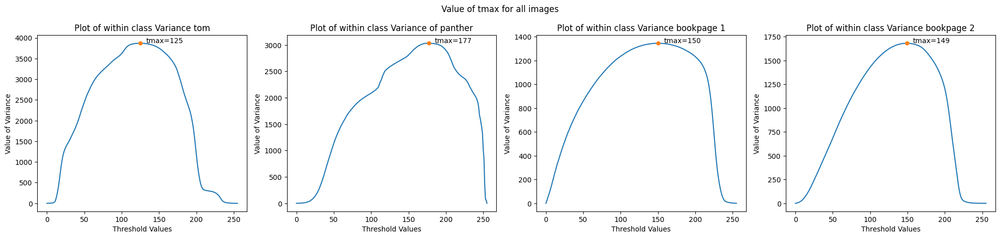

In [ ]:
xtom,tptom,ytom=plot_t(tom)
xpan,tppan,ypan=plot_t(panther)
xbook1,tpbook1,ybook1=plot_t(bookpage1)
xbook2,tpbook2,ybook2=plot_t(bookpage2)
fig,ax=plt.subplots(nrows=1,ncols=4)
fig.set_figwidth(20)
ax[0].plot(intensity_values,tptom)
ax[0].plot(xtom,ytom,marker='o',markersize='5')
ax[0].annotate(f'tmax={xtom}',xy=(xtom,ytom),xytext=(xtom+8,ytom+3))
ax[0].set_title('Plot of within class Variance tom')
ax[0].set_xlabel('Threshold Values')
ax[0].set_ylabel('Value of Variance')
ax[1].plot(intensity_values,tppan)
ax[1].plot(xpan,ypan,marker='o',markersize='5')
ax[1].annotate(f'tmax={xpan}',xy=(xpan,ypan),xytext=(xpan+8,ypan+3))
ax[1].set_title('Plot of within class Variance of panther')
ax[1].set_xlabel('Threshold Values')
ax[1].set_ylabel('Value of Variance')
ax[2].plot(intensity_values,tpbook1)
ax[2].plot(xbook1,ybook1,marker='o',markersize='5')
ax[2].annotate(f'tmax={xbook1}',xy=(xbook1,ybook1),xytext=(xbook1+8,ybook1+3))
ax[2].set_title('Plot of within class Variance bookpage 1')
ax[2].set_xlabel('Threshold Values')
ax[2].set_ylabel('Value of Variance')
ax[3].plot(intensity_values,tpbook2)
ax[3].plot(xbook2,ybook2,marker='o',markersize='5')
ax[3].annotate(f'tmax={xbook2}',xy=(xbook2,ybook2),xytext=(xbook2+8,ybook2+3))
ax[3].set_title('Plot of within class Variance bookpage 2')
ax[3].set_xlabel('Threshold Values')
ax[3].set_ylabel('Value of Variance')
fig.suptitle('Value of tmax for all images')
fig.tight_layout()
plt.show()


Here in the plot we can observe how the varience reaches  maximum value and than reduces we take the appropriate threshold which gives maximum varience.

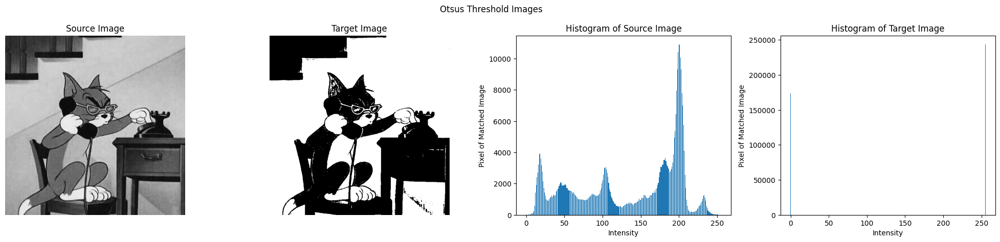

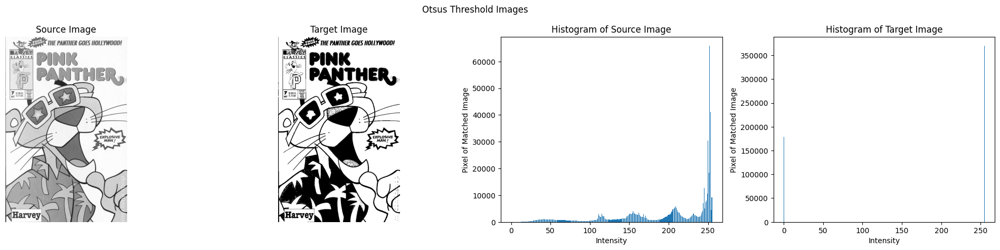

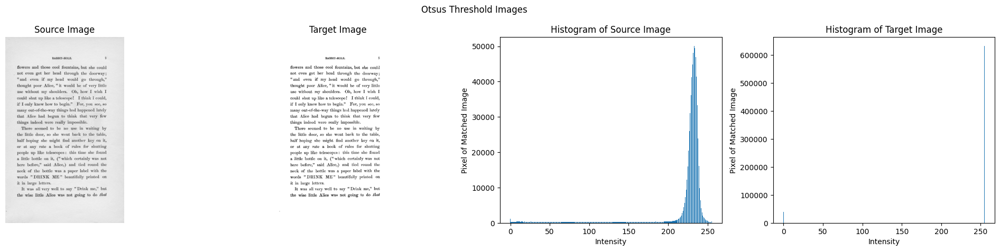

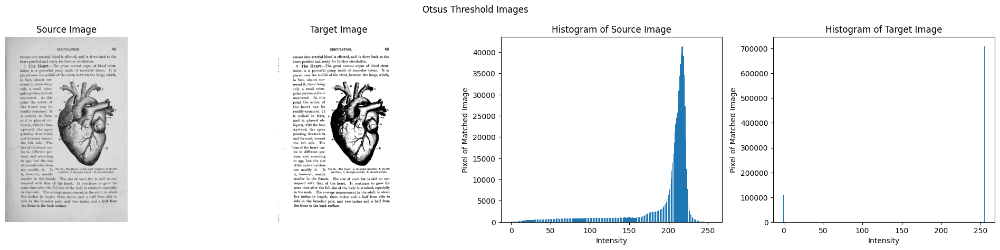

In [ ]:
image_plot(tom)
image_plot(panther)
image_plot(bookpage1)
image_plot(bookpage2)

### **Noise Addition into Image**

In [ ]:
def noice_img_plot(img,v):
  gaussian=np.random.normal(0,v**0.5,img.shape)
  noissed_img=img+gaussian
  r,c=np.shape(noissed_img)
  for i in range(r):                         #we iterate through the image in order to restor all the intensity values from 0 to 255
    for j in range(c):
      if noissed_img[i,j]<0:
        noissed_img[i,j]=0
      elif noissed_img[i,j]>255:
        noissed_img[i,j]=255
  noised_img=noissed_img.astype(np.uint8)    #this is done to make all intensity integer and change the bit back to 8
  imgnt=final_img(noised_img).astype(np.uint8)
  pixel_number=pixel_intensity(noised_img)

  fig,ax=plt.subplots(nrows=1,ncols=4)
  fig.set_figwidth(23)
  fig.set_figheight(7)
  ax[0].imshow(cv.cvtColor(noised_img, cv.COLOR_BGR2RGB))
  ax[0].axis('off')
  ax[0].set_title('Source Noised Image')
  ax[1].imshow(cv.cvtColor(imgnt, cv.COLOR_BGR2RGB))
  ax[1].axis('off')
  ax[1].set_title('Target Image')
  ax[2].bar(intensity_values,pixel_number, width = 0.75)
  ax[2].set_title('Histogram of Source Noised Image')
  ax[2].set_xlabel('Intensity')
  ax[2].set_ylabel('Pixel of Matched Image')
  ax[3].bar(intensity_values,pixel_intensity(imgnt), width = 0.75)
  ax[3].set_title('Histogram of Target Image')
  ax[3].set_xlabel('Intensity')
  ax[3].set_ylabel('Pixel of Matched Image')
  fig.suptitle('Otsus Threshold on Noised Images')
  fig.tight_layout()
  plt.show()

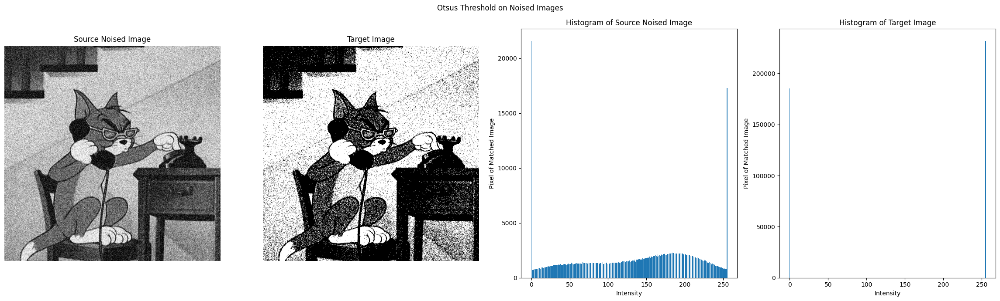

In [ ]:
noice_img_plot(tom,1600)

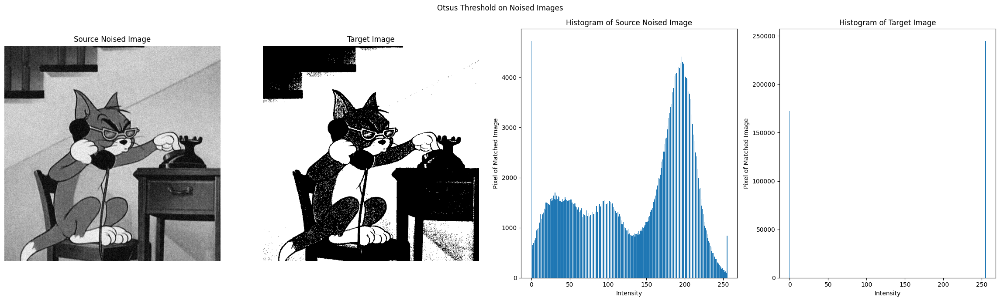

In [ ]:
noice_img_plot(tom,200)

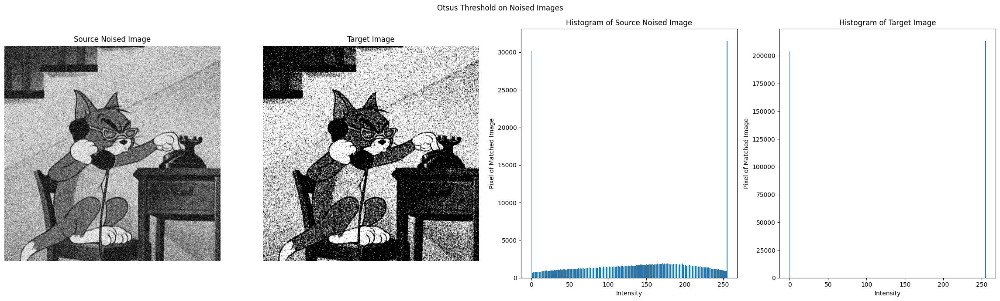

In [ ]:
noice_img_plot(tom,3000)

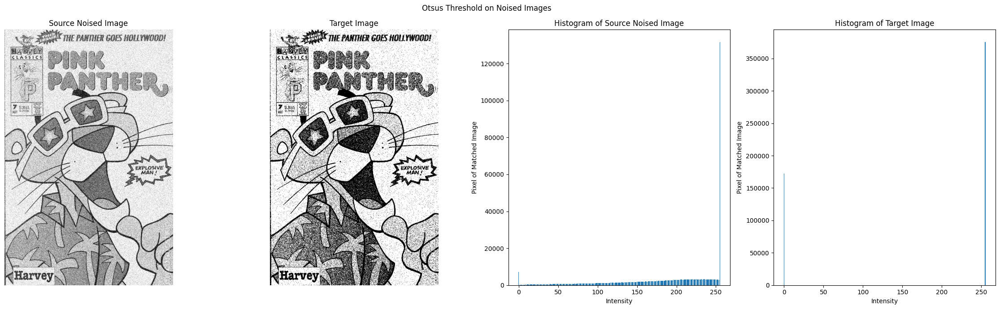

In [ ]:
noice_img_plot(panther,2000)

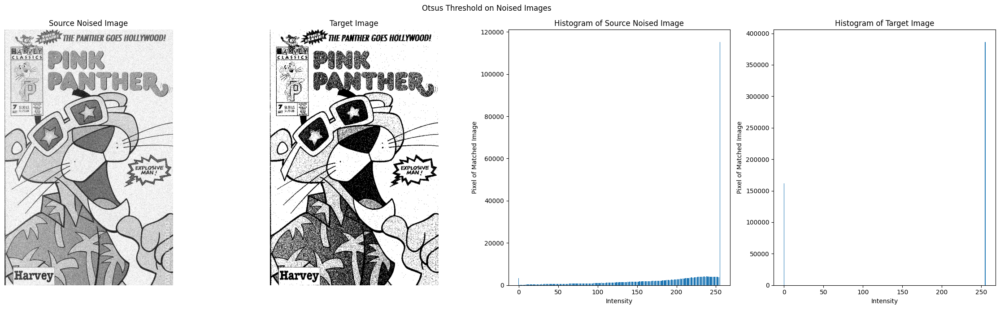

In [ ]:
noice_img_plot(panther,900)

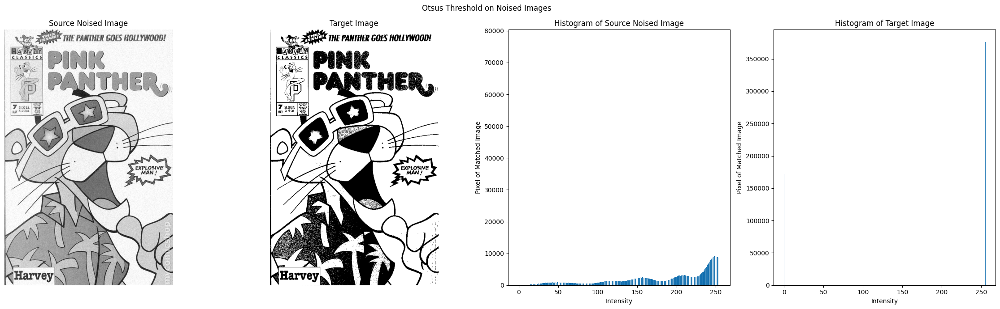

In [ ]:
noice_img_plot(panther,100)

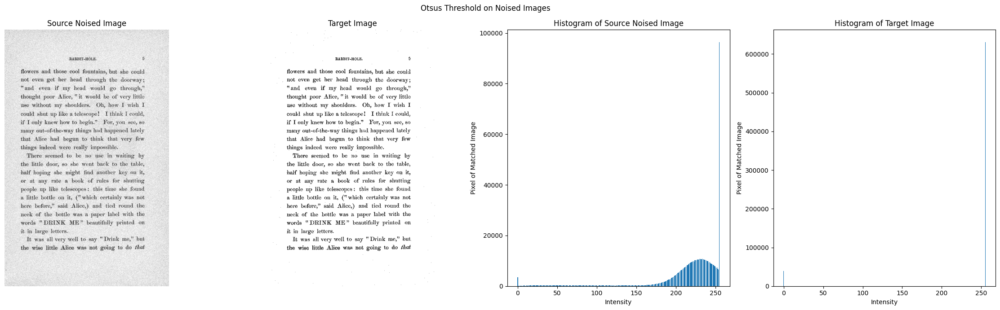

In [ ]:
noice_img_plot(bookpage1,500)

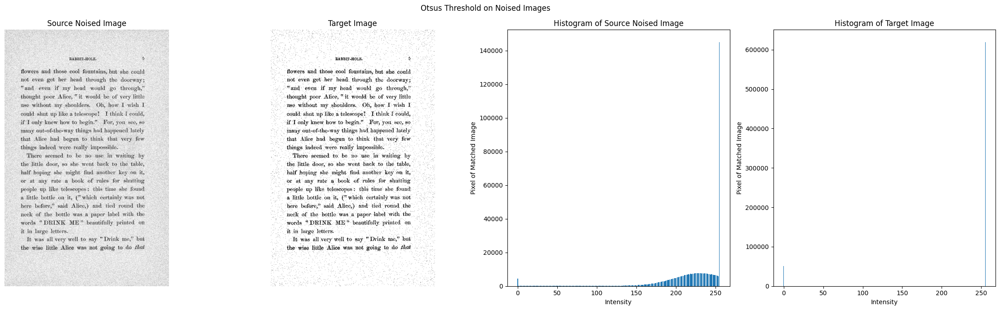

In [ ]:
noice_img_plot(bookpage1,1000)

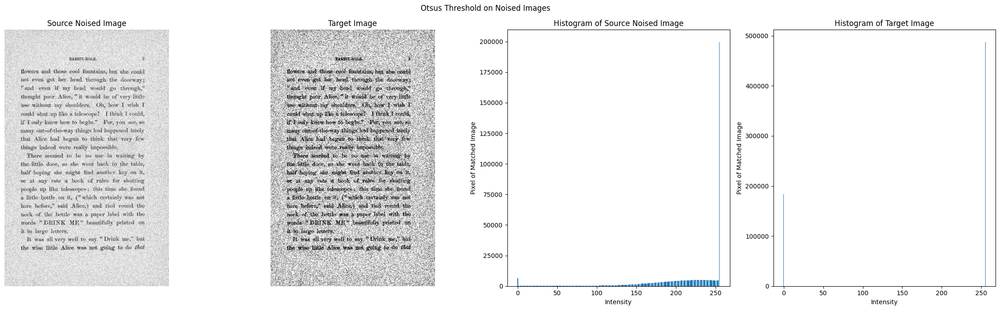

In [ ]:
noice_img_plot(bookpage1,2500)

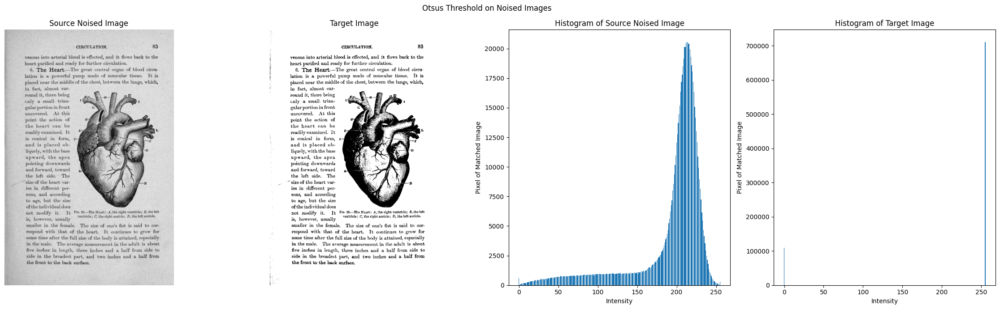

In [ ]:
noice_img_plot(bookpage2,100)

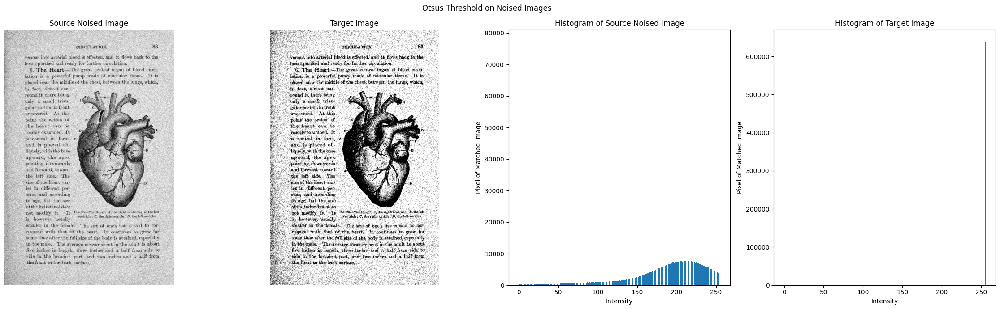

In [ ]:
noice_img_plot(bookpage2,1200)

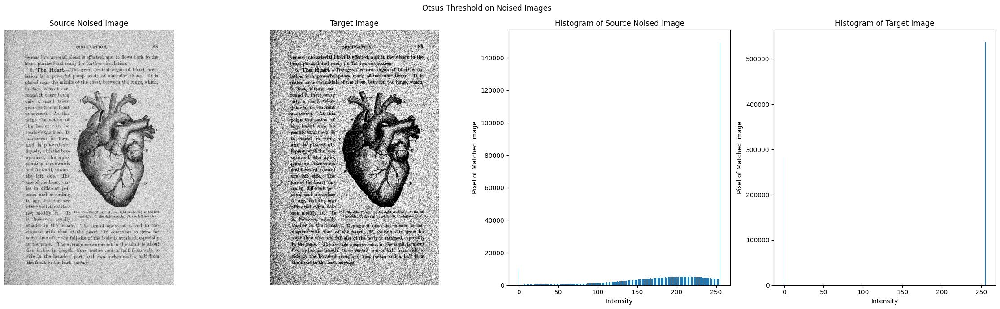

In [ ]:
noice_img_plot(bookpage2,3000)

Sources Used:

[1]“Otsu’s Thresholding Technique | Learn OpenCV,” Aug. 05, 2020. https://learnopencv.com/otsu-thresholding-with-opencv/

‌[2]“Users guide — Matplotlib 3.5.0 documentation,” matplotlib.org. https://matplotlib.org/stable/users/index.html

‌

Discussed Assignment with:

Jaskirat Singh Maskeen(23110146)

Harshil Shah(23110132)